# **pass to mdeling I will use LSTM and a hybrid approach ✅**

In [1]:
!pip install --upgrade polars
!pip install dataprep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.2/26.2 MB 35.4 MB/s eta 0:00:00
  Attempting uninstall: polars
    Found existing installation: polars 0.20.2
    Uninstalling polars-0.20.2:
      Successfully uninstalled polars-0.20.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 52.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 15.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 80.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 68.3 MB/s eta 0:00:00
  

In [2]:
# **Data processing libraries:**
import pandas as pd  # Data analysis and manipulation
import numpy as np  # Numerical computing
from prophet import Prophet
# **Data cleaning libraries:**
import missingno as msno  # Missing data visualization and imputation
import dataprep.clean  # Data cleaning and preparation
%matplotlib inline
# **Data visualization libraries:**
import seaborn as sns  # Statistical data visualization
import matplotlib.pyplot as plt  # 2D and 3D plotting
import plotly.express as px  # Interactive visualizations
import plotly.graph_objects as go  # Interactive data visualization
import polars as pl
# **Machine learning libraries:**
import sklearn  # Machine learning algorithms
from IPython.core.pylabtools import figsize
figsize(12, 4)
import datetime

In [3]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.2 MB/s eta 0:00:00


In [4]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

import datetime
from sklearn.model_selection import train_test_split
from lightgbm.sklearn import LGBMRegressor
from sklearn.metrics import mean_absolute_error


# KFold(CV), partial : optuna를 사용하기 위함
from sklearn.model_selection import KFold
from functools import partial

# hyper-parameter tuning을 위한 라이브러리, optuna
import optuna

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
file_path = '/content/drive/MyDrive/prediction energy behavior of prosumer/data'

In [7]:
file= file_path + '/production.csv'
data=pd.read_csv(file)

In [10]:
train_size = int(len(data) * 0.8)

train_data = data[:train_size]
test_data = data[train_size:]

print(f"Train data size: {len(train_data)}")
print(f"Test data size: {len(test_data)}")

Train data size: 356710
Test data size: 89178


In [9]:
# prompt: delete from df a copy of data unlamed:0 and datetetime and

data = data.drop(columns=['Unnamed: 0', 'datetime'])



In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 445888 entries, 0 to 445887
Data columns (total 27 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   product_type            445888 non-null  int64  
 1   county                  445888 non-null  int64  
 2   eic_count               445888 non-null  int64  
 3   installed_capacity      445888 non-null  float64
 4   is_business             445888 non-null  int64  
 5   target                  445888 non-null  float64
 6   temperature             445888 non-null  float64
 7   dewpoint                445888 non-null  float64
 8   rain                    445888 non-null  float64
 9   snowfall                445888 non-null  float64
 10  surface_pressure        445888 non-null  float64
 11  cloudcover_total        445888 non-null  float64
 12  windspeed_10m           445888 non-null  float64
 13  winddirection_10m       445888 non-null  float64
 14  shortwave_radiation 

In [64]:
def divied_data(df):

    X = data.drop(columns=['target'])
    y = data['target']

    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.05, random_state=42)
    return X_train, X_val, y_train, y_val
X_train, X_val, y_train, y_val = divied_data(data)

In [65]:
def create_model_lgb(model, X_train, X_val, y_train, y_val):

    model.fit(X_train, y_train)

    pred_train = model.predict(X_train)
    pred_val = model.predict(X_val)

    train_eval = evaluation_metric(y_train, pred_train)
    val_eval = evaluation_metric(y_val, pred_val)

    print("Evaluation")
    print("Train Score : %.4f" % train_eval)
    print("Test Score : %.4f" % val_eval)

    return model

In [66]:
evaluation_metric = mean_absolute_error

model = create_model_lgb(LGBMRegressor(num_leaves=512,
                          max_depth=22,
                          learning_rate=0.27,
                                       n_estimators=96,
                          random_state=42), X_train, X_val, y_train, y_val)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4319
[LightGBM] [Info] Number of data points in the train set: 423593, number of used features: 25
[LightGBM] [Info] Start training from score 43.503956
Evaluation
Train Score : 3.1033
Test Score : 7.6632


In [67]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold
import numpy as np

def optimizer(trial, X, y, K):
    # Define the hyper-parameter combinations to be adjusted
    num_leaves = trial.suggest_categorical('num_leaves', [512])  # Grid Search
    max_depth = trial.suggest_categorical('max_depth', [22])
    learning_rate = trial.suggest_float('learning_rate', 0.25, 0.3)  # low, high range
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # low, high range

    # Specify the model, initially testing with RF can save time before using LGBM
    model = LGBMRegressor(num_leaves=num_leaves,
                          max_depth=max_depth,
                          learning_rate=learning_rate,
                          n_estimators=n_estimators,
                          random_state=42)

    # Implement K-Fold Cross Validation
    folds = KFold(n_splits=K)
    losses = []

    for train_idx, val_idx in folds.split(X, y):
        X_train, X_val = X.iloc[train_idx, :], X.iloc[val_idx, :]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_train, y_train)
        preds = model.predict(X_val)
        loss = evaluation_metric(y_val, preds)  # Assuming evaluation_metric is defined elsewhere
        losses.append(loss)

    # Return the average loss across all K-Folds
    return np.mean(losses)


In [68]:
K=5
opt_func = partial(optimizer, X=X_train, y=y_train, K=K)
study = optuna.create_study(direction="minimize")
study.optimize(opt_func, n_trials=10)


[I 2024-04-01 08:21:45,481] A new study created in memory with name: no-name-9a943fd8-74f5-4dbc-a501-e636f05efb99


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4317
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.509757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-04-01 08:21:59,398] Trial 0 finished with value: 8.43094476471019 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.25492953050753686, 'n_estimators': 59}. Best is trial 0 with value: 8.43094476471019.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 08:22:14,855] Trial 1 finished with value: 8.490363319878735 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.2707803117816186, 'n_estimators': 65}. Best is trial 0 with value: 8.43094476471019.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017646 seconds.
You can set `force_row_wise

[I 2024-04-01 08:22:35,543] Trial 2 finished with value: 8.296410829289325 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.2764266934727547, 'n_estimators': 95}. Best is trial 2 with value: 8.296410829289325.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4317
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [I

[I 2024-04-01 08:22:56,840] Trial 3 finished with value: 8.218477296206704 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.2561076921122589, 'n_estimators': 92}. Best is trial 3 with value: 8.218477296206704.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 08:23:12,757] Trial 4 finished with value: 8.51438232479388 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.2849690711562415, 'n_estimators': 62}. Best is trial 3 with value: 8.218477296206704.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4317
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.509757
[LightGBM] [Warning] No

[I 2024-04-01 08:23:32,561] Trial 5 finished with value: 8.289449622365218 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.25323926639968, 'n_estimators': 84}. Best is trial 3 with value: 8.218477296206704.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4317
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.509757
[LightGBM] [Warning] No further sp

[I 2024-04-01 08:23:48,498] Trial 6 finished with value: 8.468570420708678 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.2834780593362033, 'n_estimators': 67}. Best is trial 3 with value: 8.218477296206704.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4317
[LightGBM] [Info] Number of data

[I 2024-04-01 08:24:04,585] Trial 7 finished with value: 8.521957900818304 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.28633827071170753, 'n_estimators': 68}. Best is trial 3 with value: 8.218477296206704.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 08:24:22,956] Trial 8 finished with value: 8.375683954303053 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.27552755094596415, 'n_estimators': 78}. Best is trial 3 with value: 8.218477296206704.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4312
[LightGBM] [Info] Number of data points in the train set: 338874, number of used features: 25
[LightGBM] [Info] Start training from score 43.296169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4317
[LightGBM] [Info] Number of data

[I 2024-04-01 08:24:44,581] Trial 9 finished with value: 8.323051433323707 and parameters: {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.28621636733837547, 'n_estimators': 100}. Best is trial 3 with value: 8.218477296206704.


In [69]:
display(study.trials_dataframe())

print("Best Score: %.4f" % study.best_value)
print("Best params: ", study.best_trial.params)

optuna.visualization.plot_optimization_history(study)
optuna.visualization.plot_param_importances(study)


,number,value,datetime_start,datetime_complete,duration,params_learning_rate,params_max_depth,params_n_estimators,params_num_leaves,state
0,0,8.430945,2024-04-01 08:21:45.483721,2024-04-01 08:21:59.398526,0 days 00:00:13.914805,0.254930,22,59,512,COMPLETE
1,1,8.490363,2024-04-01 08:21:59.400244,2024-04-01 08:22:14.855348,0 days 00:00:15.455104,0.270780,22,65,512,COMPLETE
2,2,8.296411,2024-04-01 08:22:14.857660,2024-04-01 08:22:35.542764,0 days 00:00:20.685104,0.276427,22,95,512,COMPLETE
3,3,8.218477,2024-04-01 08:22:35.544705,2024-04-01 08:22:56.840082,0 days 00:00:21.295377,0.256108,22,92,512,COMPLETE
4,4,8.514382,2024-04-01 08:22:56.841985,2024-04-01 08:23:12.756662,0 days 00:00:15.914677,0.284969,22,62,512,COMPLETE
5,5,8.289450,2024-04-01 08:23:12.759080,2024-04-01 08:23:32.561392,0 days 00:00:19.802312,0.253239,22,84,512,COMPLETE
6,6,8.468570,2024-04-01 08:23:32.563302,2024-04-01 08:23:48.498036,0 days 00:00:15.934734,0.283478,22,67,512,COMPLETE
7,7,8.521958,2024-04-01 08:23:48.499905,2024-04-01 08:24:04.584933,0 days 00:00:16.085028,0.286338,22,68,512,COMPLETE
8,8,8.375684,2024-04-01 08:24:04.586828,2024-04-01 08:24:22.956638,0 days 00:00:18.369810,0.275528,22,78,512,COMPLETE
9,9,8.323051,2024-04-01 08:24:22.958454,2024-04-01 08:24:44.580744,0 days 00:00:21.622290,0.286216,22,100,512,COMPLETE


Best Score: 8.2185
Best params:  {'num_leaves': 512, 'max_depth': 22, 'learning_rate': 0.2561076921122589, 'n_estimators': 92}


In [70]:
best_params = study.best_trial.params

best_model = LGBMRegressor(**best_params, random_state=42)

train_data_X = train_data.drop(columns=['target'])
train_data_y = train_data['target']

best_model.fit(train_data_X, train_data_y)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4304
[LightGBM] [Info] Number of data points in the train set: 356710, number of used features: 25
[LightGBM] [Info] Start training from score 34.958239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMRegressor(learning_rate=0.2561076921122589, max_depth=22, n_estimators=92,
              num_leaves=512, random_state=42)

In [71]:
grouped_data = test_data.groupby(['county', 'product_type', 'is_business'])

In [72]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Your test_data preparation and model training should be done before this

# Placeholder for evaluation results
results = []

# Iterate over each group in the test dataset
for (county, product_type, is_business), group in test_data.groupby(['county', 'product_type', 'is_business']):
    # Prepare the features and target for the current group
    X_test = group.drop(columns=['target'])
    y_true = group['target']

    # Predict using the trained model
    y_pred = best_model.predict(X_test)

    # Calculate evaluation metrics for the current group
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    # Store the results
    results.append({
        'county': county,
        'product_type': product_type,
        'is_business': is_business,
        'R2': r2,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

# Optionally, convert results to a DataFrame for better visualization
import pandas as pd
results_df = pd.DataFrame(results)

# Display or use the results
print(results_df)


    county  product_type  is_business        R2        MAE           MSE  \
0        0             0            1  0.700907  11.305547   1066.584773   
1        0             1            0  0.903776  60.986921  21912.428102   
2        0             1            1  0.691716  38.326080  11514.829263   
3        0             2            0 -4.820209   4.978161    177.189948   
4        0             2            1 -0.116037   3.063811     49.827081   
..     ...           ...          ...       ...        ...           ...   
60      15             0            1  0.642599  10.405591    725.725690   
61      15             1            0  0.882895   6.743284    242.173671   
62      15             1            1  0.914358   8.909486    531.106026   
63      15             3            0  0.946502  18.073264   2218.733323   
64      15             3            1  0.898558  24.313795   4164.096343   

          RMSE  
0    32.658609  
1   148.028471  
2   107.307172  
3    13.311271  
4 

<ipython-input-73-32b7bc10514e>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-73-32b7bc10514e>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



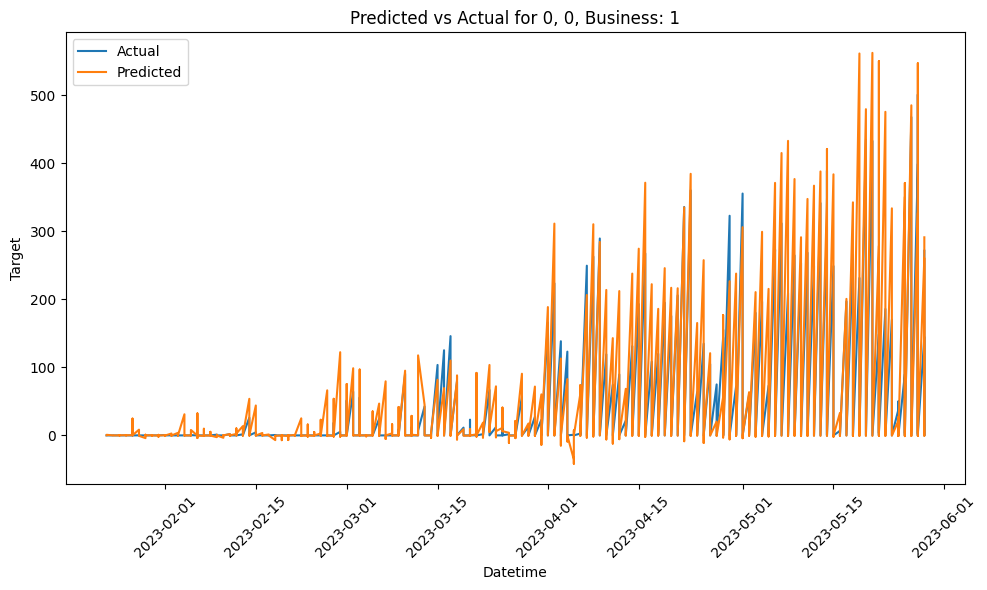

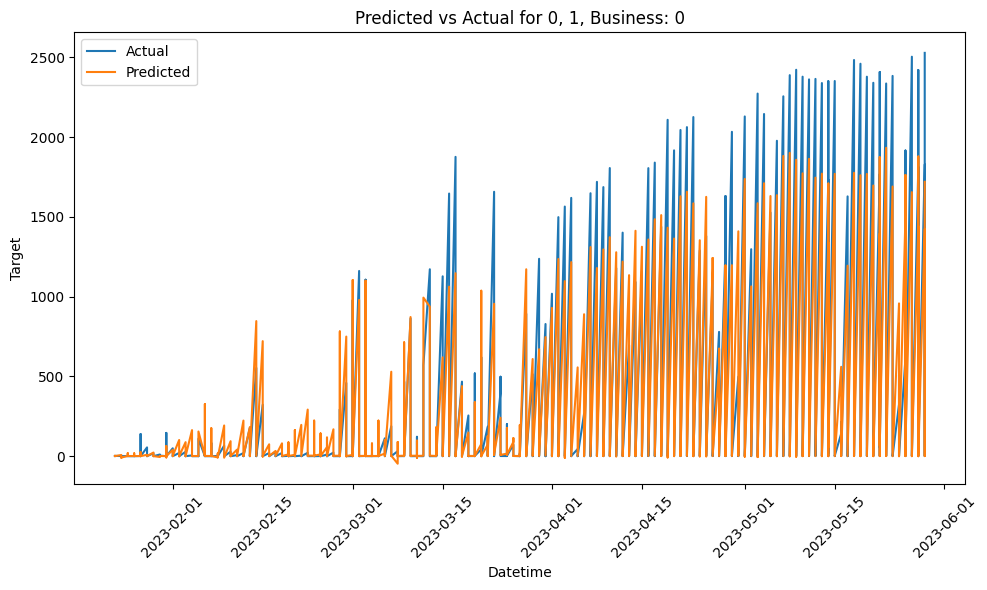

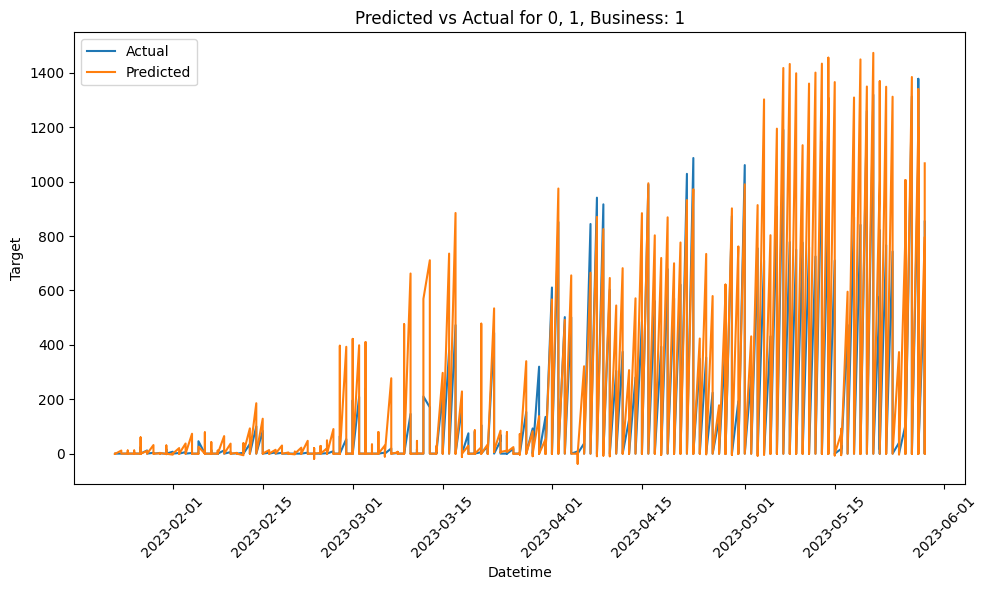

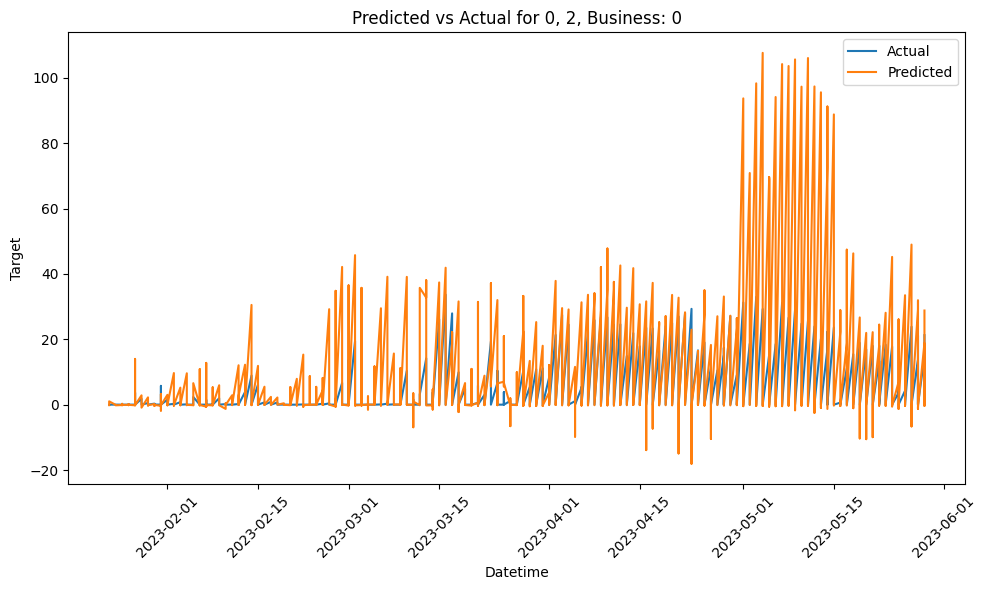

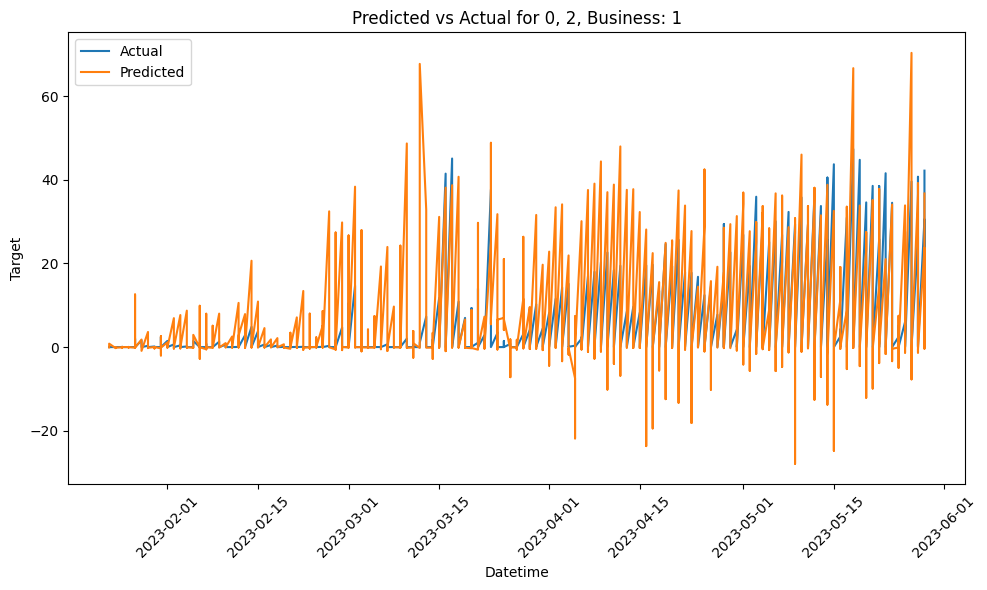

...

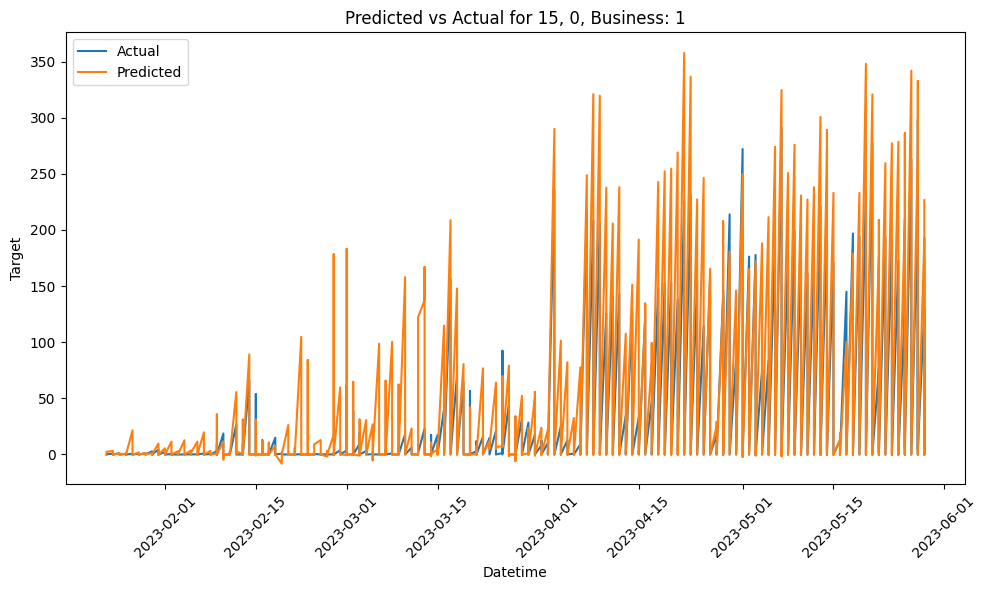

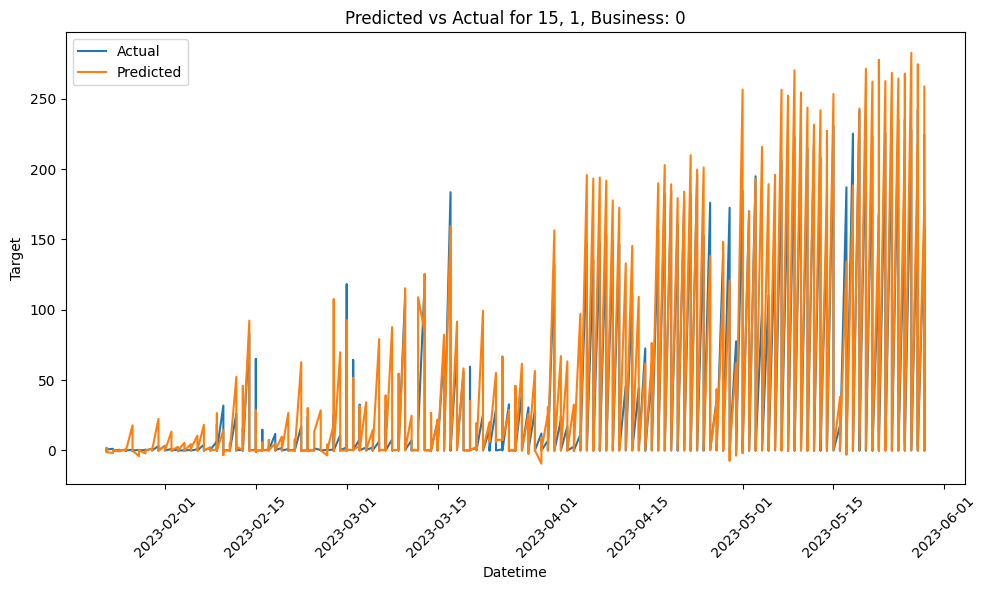

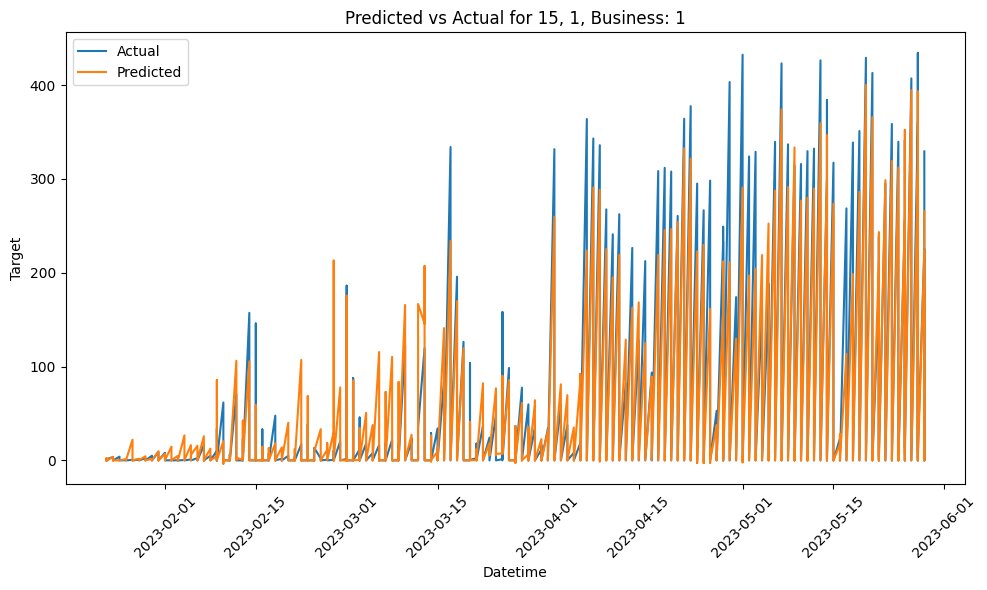

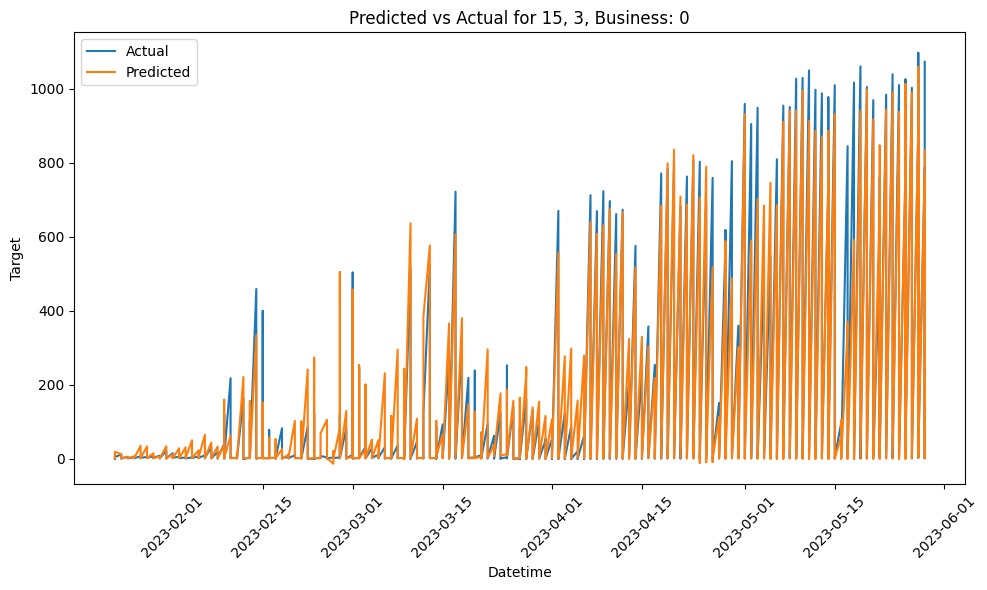

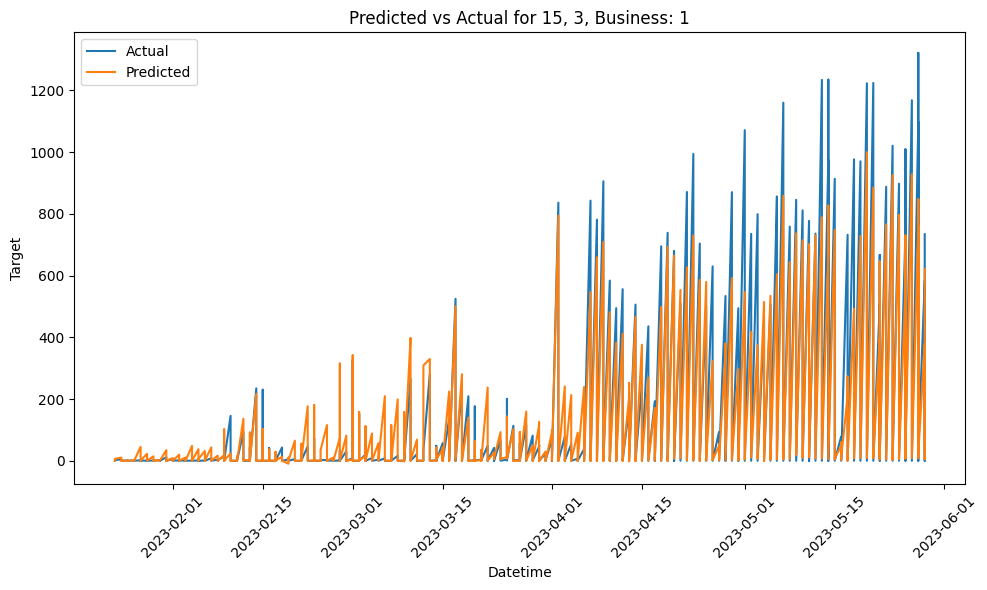

In [73]:
import pandas as pd
import matplotlib.pyplot as plt



# Predict for the entire test dataset
X_test = test_data.drop(columns=['target'])
test_data['predicted'] = best_model.predict(X_test)

# Now, for plotting predicted vs actual for each group
groups = test_data.groupby(['county', 'product_type', 'is_business'])
test_data['datetime'] = pd.to_datetime(test_data[['year', 'month', 'day', 'hour']])
for (county, product_type, is_business), group in groups:
    # Sort the group by datetime for plotting
    group = group.sort_values('datetime')

    plt.figure(figsize=(10, 6))
    plt.plot(group['datetime'], group['target'], label='Actual')
    plt.plot(group['datetime'], group['predicted'], label='Predicted')

    plt.title(f'Predicted vs Actual for {county}, {product_type}, Business: {is_business}')
    plt.xlabel('Datetime')
    plt.ylabel('Target')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [49]:
results_df.sample(65)

,county,product_type,is_business,R2,MAE,MSE,RMSE
27,5,3,1,0.884571,45.601127,14064.904554,118.595550
5,0,3,0,0.811144,254.828527,472964.169105,687.723905
46,11,1,0,0.883969,26.507111,4021.133590,63.412409
62,15,1,1,0.895286,10.152459,649.375683,25.482851
63,15,3,0,0.938880,21.159163,2534.847030,50.347264
...,...,...,...,...,...,...,...
39,9,3,0,0.919234,24.887668,3566.670103,59.721605
31,7,1,1,0.870519,13.854409,1560.133889,39.498530
35,8,3,0,0.913801,18.534143,2016.523384,44.905717
55,13,3,1,0.756185,113.939525,291587.715880,539.988626


<ipython-input-74-b8917a0dd9f6>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



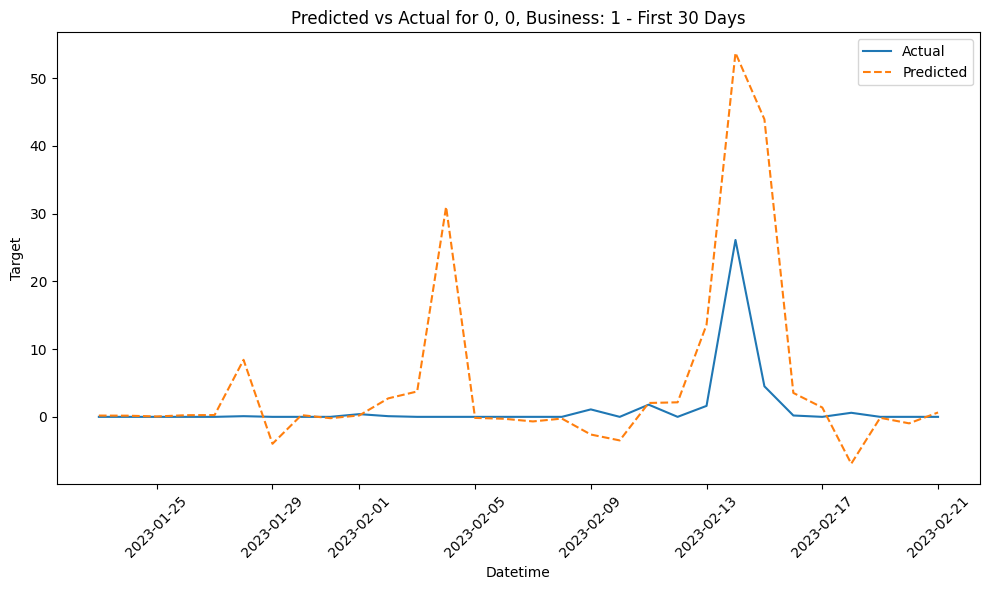

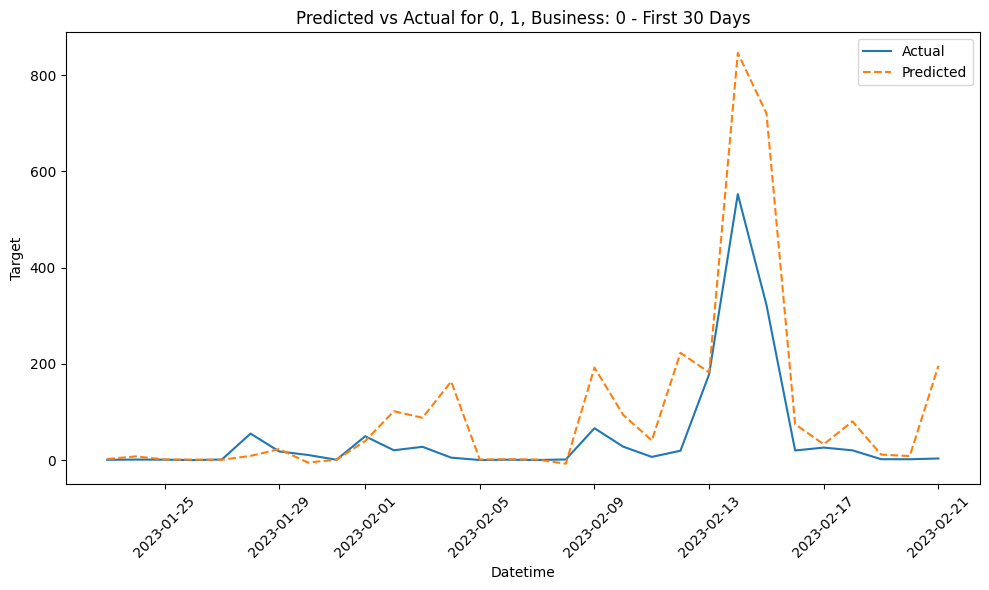

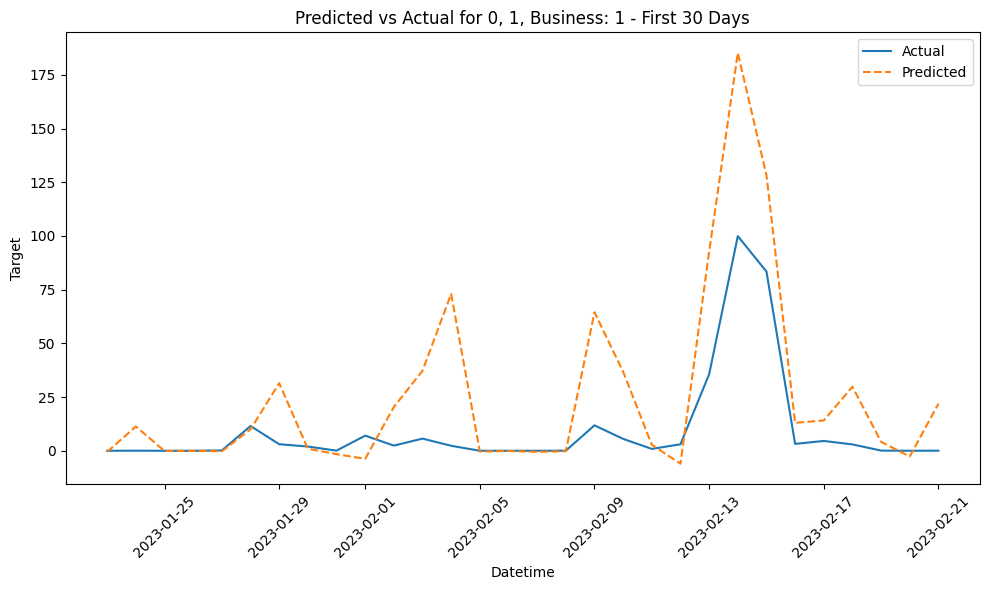

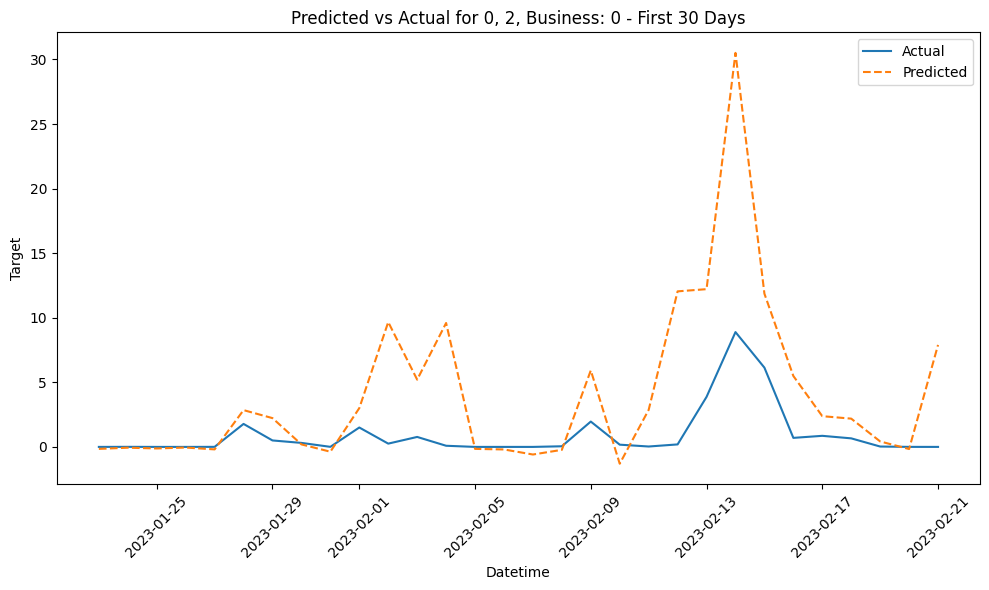

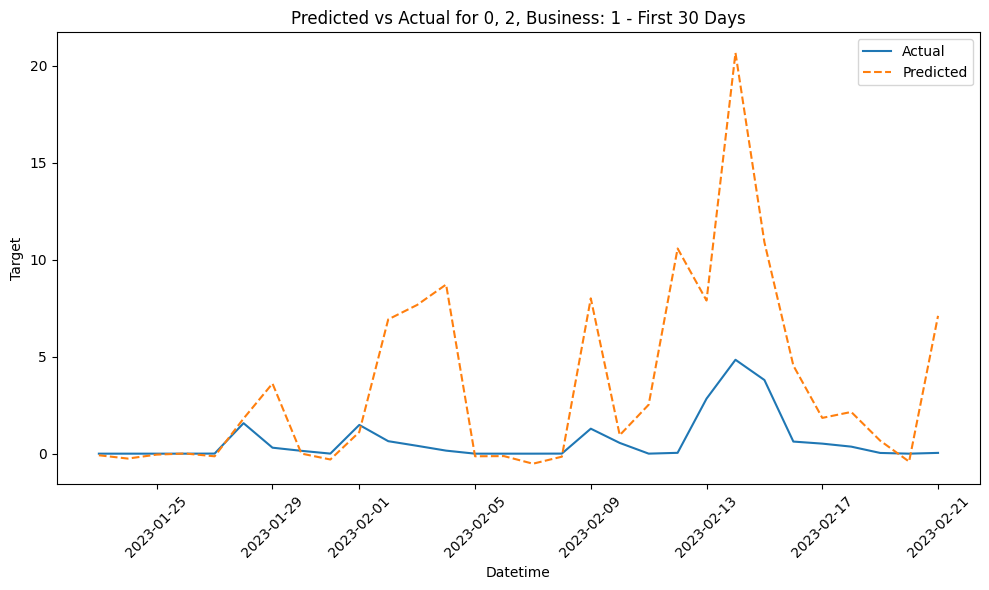

...

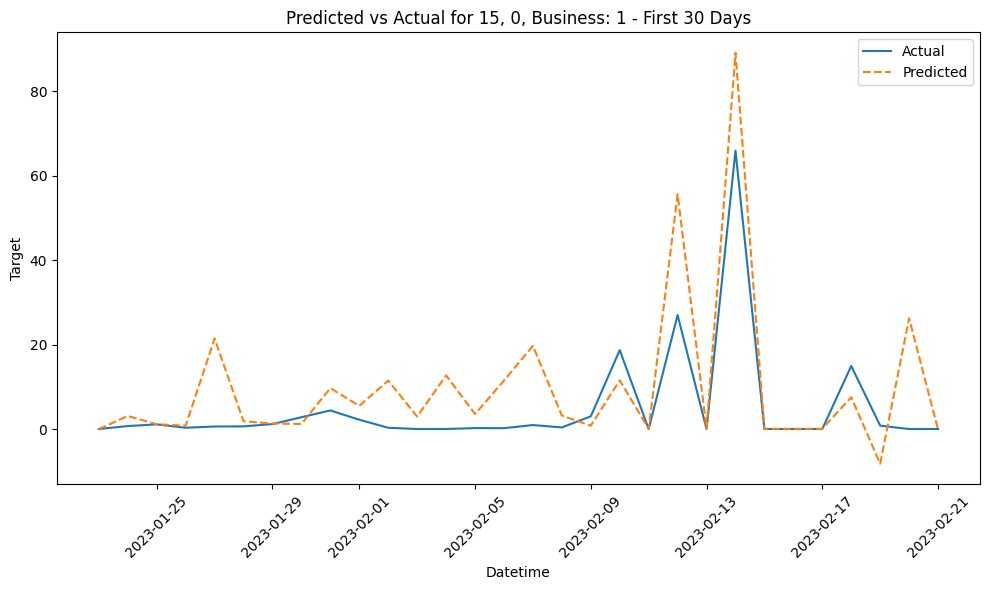

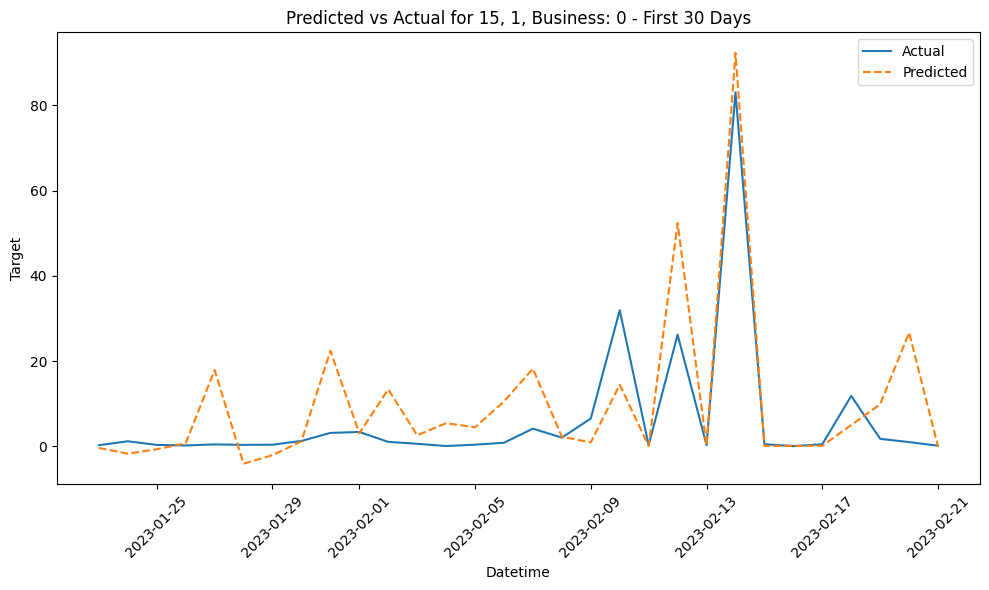

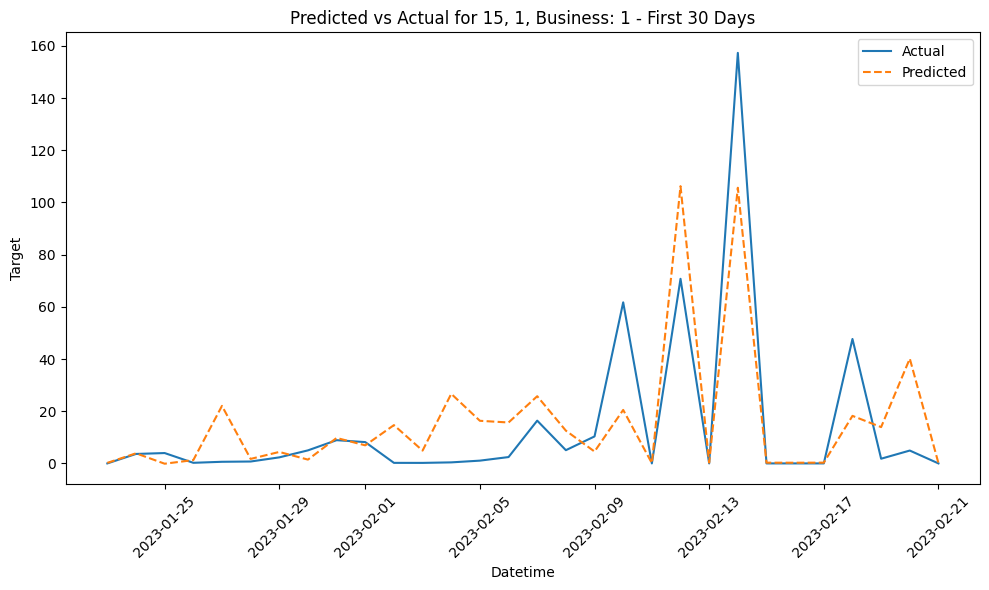

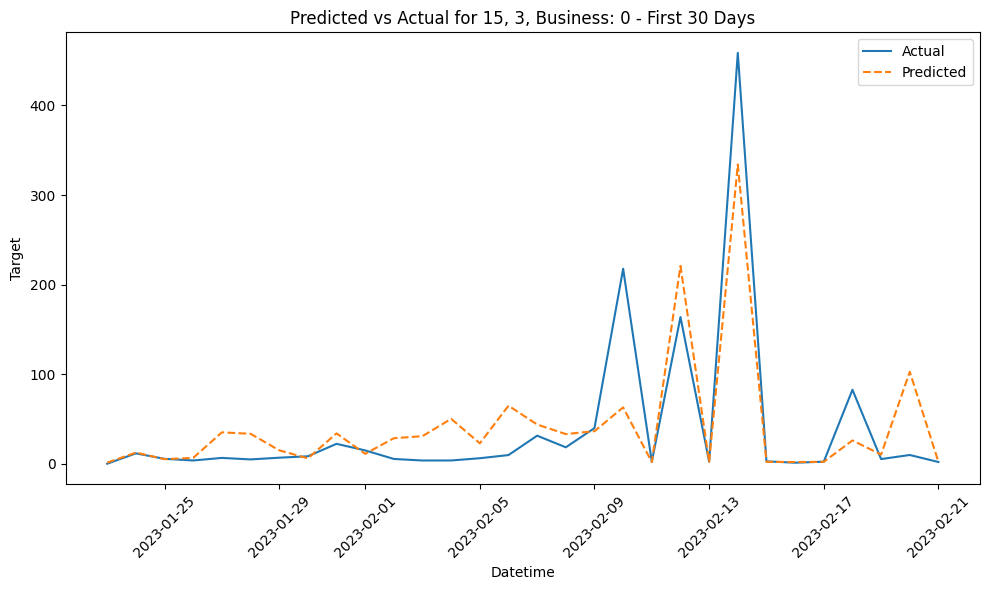

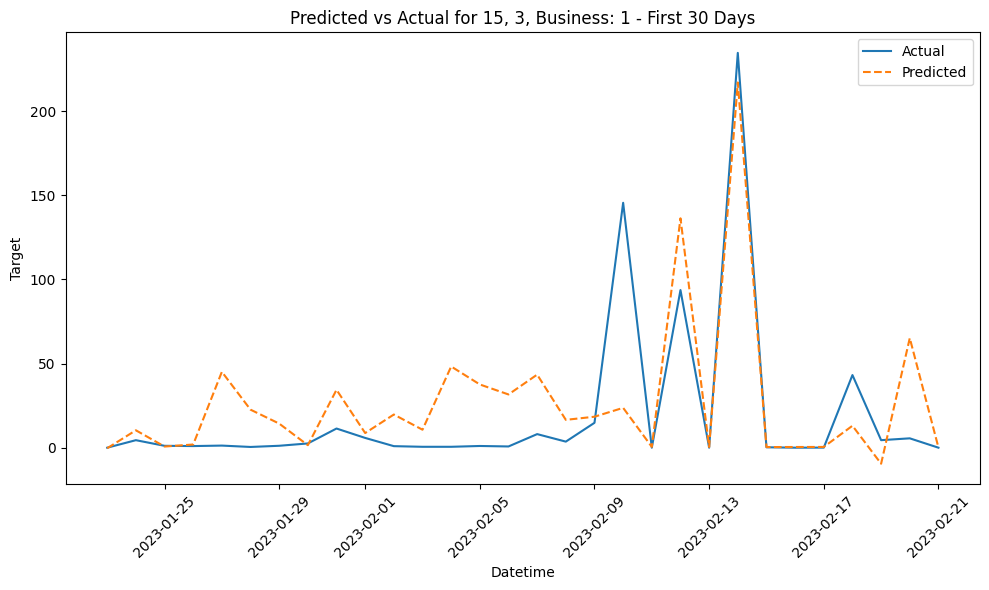

In [74]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'hour', 'day', 'month', 'year' are columns in your test_data
# First, combine these into a datetime column
test_data['datetime'] = pd.to_datetime(test_data[['year', 'month', 'day', 'hour']])

# Adjust your prediction code as needed before this step

# Now, for plotting predicted vs actual for each group limited to the first 30 days
groups = test_data.groupby(['county', 'product_type', 'is_business'])

for (county, product_type, is_business), group in groups:
    # Sort the group by datetime for plotting
    group = group.sort_values('datetime')

    # Limit the data to the first 30 days
    # Assuming each row represents a unique day or aggregating by day if needed
    limited_group = group.drop_duplicates(subset=['year', 'month', 'day']).head(30)

    plt.figure(figsize=(10, 6))
    plt.plot(limited_group['datetime'], limited_group['target'], label='Actual')
    plt.plot(limited_group['datetime'], limited_group['predicted'], label='Predicted', linestyle='--')

    plt.title(f'Predicted vs Actual for {county}, {product_type}, Business: {is_business} - First 30 Days')
    plt.xlabel('Datetime')
    plt.ylabel('Target')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# **USING LSTM ✅**

In [11]:
grouped_data = data.groupby(['county', 'product_type', 'is_business'])

In [12]:

df = grouped_data.get_group((0, 1, 0))

In [13]:
# prompt: split the df into train and test

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]


In [14]:
features=data[[ 'eic_count', 'installed_capacity',
        'temperature', 'dewpoint', 'rain', 'snowfall',
       'surface_pressure', 'cloudcover_total', 'windspeed_10m',
       'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
       'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
       'elect_prices']].to_numpy().tolist()

trainX shape == (5547, 48, 24).
trainY shape == (5547, 1).
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 48, 32)            7296      
                                                                 
 lstm_3 (LSTM)               (None, 32)                8320      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 15649 (61.13 KB)
Trainable params: 15649 (61.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/100
312/312 [==============================] - 10s 25ms/step - loss: 0.8718 - val_l

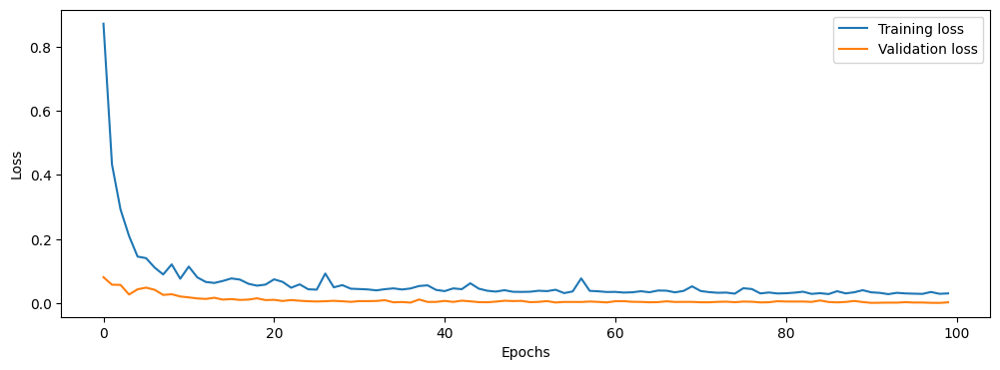

In [17]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt



# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'hour', 'dayofweek', 'quarter', 'month', 'year',
        'dayofyear', 'day', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()


df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48  # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
  trainX.append(df_for_training_scaled[i - n_past:i])
  trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))

model = Sequential()
model.add(LSTM(32, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model.compile(optimizer='adam', loss='mse')
model.summary()


history = model.fit(trainX, trainY, epochs=100, batch_size=16, validation_split=0.1, verbose=1)


plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()




8/8 [==============================] - 0s 12ms/step


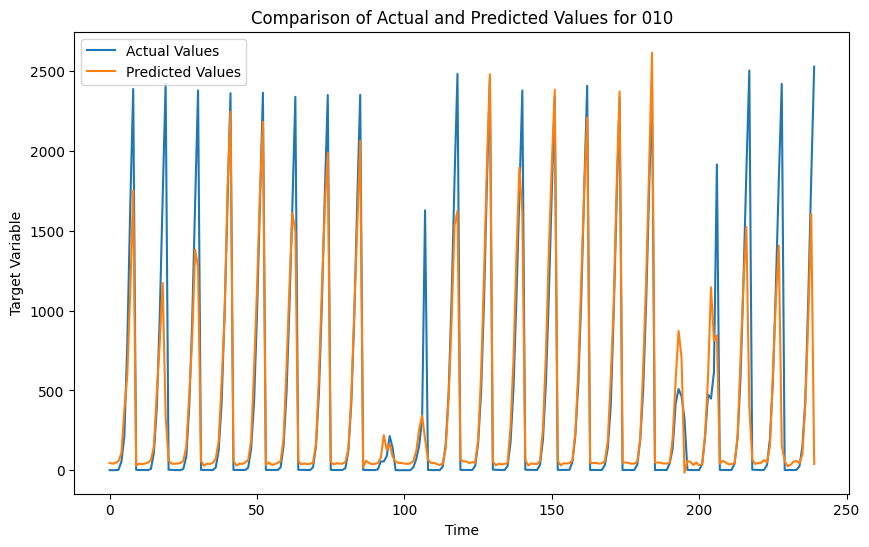

Group: 010
R2 Score: 0.7776303281114978
MSE: 126655.09353439276
RMSE: 355.88634918242195
MAE: 141.41205894200007



In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import load_model
import matplotlib.pyplot as plt

df_test = test_df[cols].astype(float)



# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []
n_future = 1  # Same as during training
n_past = 48  # Same as during training
n_days_for_prediction=120
# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 240



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()

# Print metrics
print(f"Group: 010")
print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")


trainX shape == (5547, 48, 24).
trainY shape == (5547, 1).
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 48, 128)           78336     
                                                                 
 lstm_8 (LSTM)               (None, 48, 64)            49408     
                                                                 
 lstm_9 (LSTM)               (None, 32)                12416     
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 140193 (547.63 KB)
Trainable params: 140193 (547.63 KB)
Non-trainable params: 0 (0.00 Byte)
_____________________

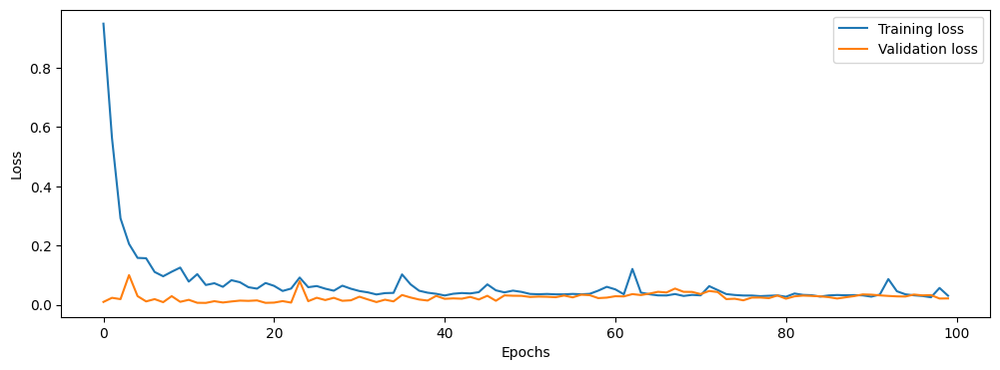

In [20]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt



# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'hour', 'dayofweek', 'quarter', 'month', 'year',
        'dayofyear', 'day', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()


df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48  # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
  trainX.append(df_for_training_scaled[i - n_past:i])
  trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))

model1 = Sequential()
model1.add(LSTM(128, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model1.add(LSTM(64, activation='relu', return_sequences=True))
model1.add(LSTM(32, activation='relu', return_sequences=False))
model1.add(Dropout(0.2))
model1.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model1.compile(optimizer='adam', loss='mse')
model1.summary()


history = model1.fit(trainX, trainY, epochs=100, batch_size=16, validation_split=0.1, verbose=1)


plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


4/4 [==============================] - 0s 34ms/step


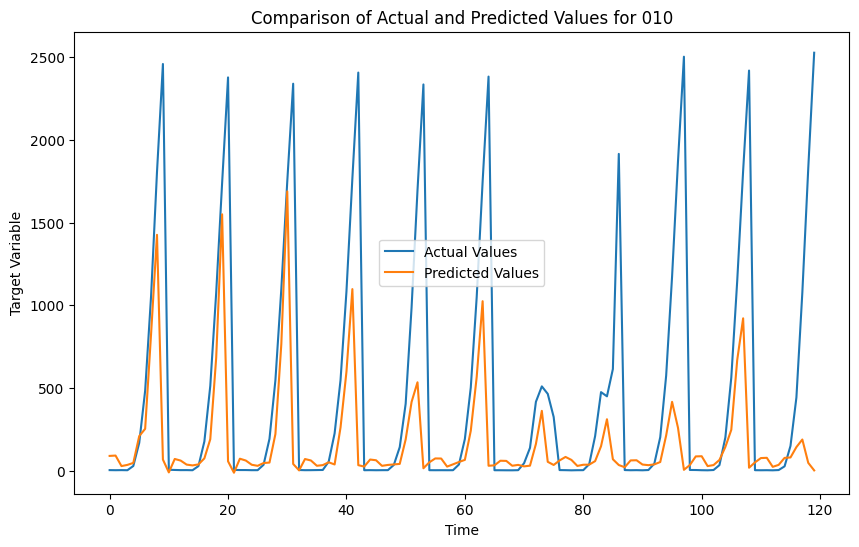

Group: 010
R2 Score: 0.01941361863025981
MSE: 571287.3040881798
RMSE: 755.8355006799958
MAE: 367.05251282265186



In [27]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import load_model
import matplotlib.pyplot as plt

# Assuming test_df and cols are defined correctly
df_test = test_df[cols].astype(float)

# Assuming 'scaler' is already fitted with the training data
df_test_scaled = scaler.transform(df_test)  # Use transform directly, not fit_transform

# Initialize the lists for testX and testY
testX = []
testY = []
n_future = 1  # Same as during training
n_past = 48  # Same as during training
n_days_for_prediction = 120
# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is the target

testX, testY = np.array(testX), np.array(testY)

# Assuming the target column exists in df_test for the target scaler
target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])

# Assuming 'model1' is already loaded or defined
prediction_scaled = model1.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:].reshape(-1, 1))

# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title('Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()

# Print metrics
print("Group: 010")
print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")


In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

# Assuming trainX and trainY are defined somewhere above this snippet

# Define a function to create the Keras model
def build_model(optimizer='adam', n_neurons=64):
    model = Sequential()
    model.add(LSTM(n_neurons, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
    model.add(LSTM(int(n_neurons / 2), activation='relu', return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer=optimizer, loss='mse')
    return model

# Wrap the model so it can be used by scikit-learn
model = KerasRegressor(build_fn=build_model, verbose=0)

# Define the grid search parameters
param_grid = {
    'batch_size': [16, 32],
    'epochs': [50, 100],
    'optimizer': ['adam', 'rmsprop'],
    'n_neurons': [64, 128]
}

# Create GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3, scoring='neg_mean_squared_error')

# Fit the model
grid_result = grid.fit(trainX, trainY)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
for params, mean_score, scores in zip(grid_result.cv_results_['params'], grid_result.cv_results_['mean_test_score'], grid_result.cv_results_['std_test_score']):
    print("%f (%f) with: %r" % (mean_score, scores, params))



ModuleNotFoundError: No module named 'tensorflow.keras.wrappers'

In [10]:
!pip install keras.wrappers

ERROR: Could not find a version that satisfies the requirement keras.wrappers (from versions: none)
ERROR: No matching distribution found for keras.wrappers


In [9]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV


ModuleNotFoundError: No module named 'keras.wrappers'

# **CNN +  LSTM**

In [28]:
!pip install tensorflow

In [30]:
train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]


In [31]:
features=df[[ 'eic_count', 'installed_capacity',
        'temperature', 'dewpoint', 'rain', 'snowfall',
       'surface_pressure', 'cloudcover_total', 'windspeed_10m',
       'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
       'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
       'elect_prices']]

In [33]:
trainX= train_df[cols].astype(float)
trainY = train_df['target'].astype(float)
testX = test_df[cols].astype(float)
testY = test_df['target'].astype(float)

In [38]:
!pip install tensorflow.keras.layers

ERROR: Could not find a version that satisfies the requirement tensorflow.keras.layers (from versions: none)
ERROR: No matching distribution found for tensorflow.keras.layers


In [42]:
trainX = np.array(trainX)
trainY = np.array(trainY)
testX = np.array(testX)
testY = np.array(testY)
trainX = trainX.reshape(trainX.shape[0], 24)
testX = testX.reshape(testX.shape[0], 24)
trainY = trainY.reshape(trainY.shape[0])
testY = testY.reshape(testY.shape[0])

In [46]:
trainX.shape[2]

IndexError: tuple index out of range

In [48]:
import tensorflow as tf
from tensorflow.keras.layers import CONV1D , GRU , Dense , Dropout, Bidirectional,  TimeDistributed
from tensorflow.keras.layers import MaxPooling1D , Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2,l1
from tensorflow.keras.metrics import RootMeanSquaredError


model = tf.keras.Sequential()

model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
model.add(MaxPooling1D(2))


#GRU layers

model.add(Bidirectional(GRU(100,return_sequences=False)))
model.add(Dropout(0.5))

model.add(Dense(1,activation='linear'))
model.compile(optimizer='adam', loss='mse',metrics=['mse','mae'])
model.summary()

history = model.fit(trainX, trainY, epochs=100, batch_size=32, validation_data=(testX, testY))

ImportError: cannot import name 'CONV1D' from 'tensorflow.keras.layers' (/usr/local/lib/python3.10/dist-packages/keras/api/_v2/keras/layers/__init__.py)

In [47]:
!pip install tensorflow.keras.layers

ERROR: Could not find a version that satisfies the requirement tensorflow.keras.layers (from versions: none)
ERROR: No matching distribution found for tensorflow.keras.layers
